<a href="https://colab.research.google.com/github/maverick98/CDS/blob/main/Group4_ImageCaption_Transformer_200_epochs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:


gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)
     


Mon Mar 20 07:18:32 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    51W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:


#Uncomment for the first time
#!pip install keras
!pip install gensim
!pip install python-levenshtein
     


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 KB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 13.3 MB/s eta 0:00:00


In [3]:
import numpy as np
import string
import tensorflow as tf
from tensorflow import math, matmul, reshape, shape, transpose, cast, float32
from tensorflow.keras.layers import Embedding,Dense, Layer
from tensorflow.keras.backend import softmax
from pickle import load, dump, HIGHEST_PROTOCOL
from sklearn.utils import shuffle
from numpy import savetxt
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow import convert_to_tensor, int64
from tensorflow.keras.layers import LayerNormalization,   ReLU, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import LearningRateSchedule
from tensorflow.keras.metrics import Mean
from tensorflow import data, train,  reduce_sum,  equal, argmax,GradientTape, function
from tensorflow.keras.losses import sparse_categorical_crossentropy
from time import time
from pickle import dump
from tensorflow import    linalg, ones, maximum, newaxis
from tensorflow.keras import Model
from pickle import load
from tensorflow import Module
from tensorflow import   TensorArray, argmax,  transpose
from matplotlib.pylab import plt
from numpy import arange

from keras.utils import to_categorical
import numpy as np
from numpy import array
import pandas as pd
import cv2
from glob import glob
import PIL
import time
#from tqdm import tqdm
import os
import gensim
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import sentence_bleu
from PIL import Image
import random

In [ ]:

#Uncomment for the first time.
#!wget  https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip
#!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip
     


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
!cp /content/drive/MyDrive/Capstone/Flickr8k_Dataset.zip .
!cp /content/drive/MyDrive/Capstone/Flickr8k_text.zip . 


In [6]:
!mkdir -p ./dataset/images
!mkdir -p ./dataset/texts
!unzip  /content/Flickr8k_text.zip -d ./dataset/texts
!unzip /content/Flickr8k_Dataset.zip -d ./dataset/images

Streaming output truncated to the last 5000 lines.
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._342872408_04a2832a1b.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/3429142249_d09a32e291.jpg  
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._3429142249_d09a32e291.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/3429194423_98e911a101.jpg  
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._3429194423_98e911a101.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/3429351222_17ae744daf.jpg  
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._3429351222_17ae744daf.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/3429351964_531de1bf16.jpg  
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._3429351964_531de1bf16.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/3429391520_930b153f94.jpg  
  inflating: ./dataset/images/__MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: ./dataset/images/Flicker8k_Dataset/

PrepareDataset.py

In [7]:
class PrepareDataset:
    def __init__(self,image_path,token_file,data_limit,top_k, **kwargs):
        super().__init__(**kwargs)
        self.image_path=image_path
        self.token_file=token_file
        self.data_limit=data_limit
        tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
        self.tokenizer=tokenizer
        self.data=None
        self.all_img_name_vector=None
        self.all_captions=None
    def load_dataframe(self):

        file = open(self.token_file,'r')
        text = file.read()
        file.close()

        datatxt = []
        for line in text.split('\n'):
            col = line.split('\t')
            if len(col) == 1:
                continue
            w = col[0].split("#")
            datatxt.append(w + [col[1].lower()])

        data = pd.DataFrame(datatxt,columns=["filename","index","caption"])
        data = data.reindex(columns =['index','filename','caption'])
        data = data[data['filename'] != '2258277193_586949ec62.jpg.1']
        uni_filenames = np.unique(data.filename.values)
        self.data=data
        return data
    def show_stats(self):
        jpgs = os.listdir(self.image_path)
        print("Total Images in Dataset = {}".format(len(jpgs)))

        vocabulary = []
        for txt in self.data.caption.values:
            vocabulary.extend(txt.split())
        print('Vocabulary Size: %d' % len(set(vocabulary)))
        img = self.data["filename"].tolist()
        caption = self.data["caption"].tolist()
        print(f"len(img) : {len(img)}")
        print(f"len(caption) : {len(caption)}")

        print(f"len(all_img_name_vector) : {len(self.all_img_name_vector)}")
        print(f"len(all_captions) : {len(self.all_captions)}")

        print(f"len(img_name_vector) : {len(self.img_name_vector)}")
        print(f"len(train_captions) : {len(self.train_captions)}")

        
    # To remove punctuations
    def remove_punctuation(self,text_original):
        text_no_punctuation = text_original.translate(string.punctuation)
        return(text_no_punctuation)

    # To remove single characters
    def remove_single_character(self,text):
        text_len_more_than1 = ""
        for word in text.split():
            if len(word) > 1:
                text_len_more_than1 += " " + word
        return(text_len_more_than1)

    # To remove numeric values
    def remove_numeric(self,text):
        text_no_numeric = ""
        for word in text.split():
            isalpha = word.isalpha()
            if isalpha:
                text_no_numeric += " " + word
        return(text_no_numeric)
    def text_clean(self,text_original):
        text = self.remove_punctuation(text_original)
        text = self.remove_single_character(text)
        text = self.remove_numeric(text)
        return(text)
    def clean_data(self):
        for i, caption in enumerate(self.data.caption.values):
            newcaption = self.text_clean(caption)
            self.data["caption"].iloc[i] = newcaption
        clean_vocabulary = []
        for txt in self.data.caption.values:
            clean_vocabulary.extend(txt.split())
        print('Clean Vocabulary Size: %d' % len(set(clean_vocabulary)))
    def load_all_captions(self):
        self.all_captions = []

        for caption  in self.data["caption"].astype(str):
            caption = '<start> ' + caption+ ' <end>'
            self.all_captions.append(caption)
    def load_all_image_names(self):
        self.all_img_name_vector = []
        for annot in self.data["filename"]:
            full_image_path = self.image_path + annot
            self.all_img_name_vector.append(full_image_path)
         
    def data_limiter(self):
        train_captions, img_name_vector = shuffle(self.all_captions,self.all_img_name_vector,random_state=1)
        self.train_captions = train_captions[:self.data_limit]
        self.img_name_vector = img_name_vector[:self.data_limit]
    def load_all(self):
        self.load_dataframe()
        print(self.data.head())
        self.clean_data()
        self.load_all_captions()      
        self.load_all_image_names()
        self.data_limiter()
    def load_image_model(self):
        image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
        new_input = image_model.input
        hidden_layer = image_model.layers[-1].output
        self.image_features_extract_model = tf.keras.Model(new_input, hidden_layer)
        return self.image_features_extract_model
        
    def load_image(self,image_path):
        img = tf.io.read_file(image_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, (299, 299))
        img = tf.keras.applications.inception_v3.preprocess_input(img)
        return img, image_path
    
    def tokenize_captions(self):
        self.tokenizer.fit_on_texts(self.train_captions)
        train_seqs = self.tokenizer.texts_to_sequences(self.train_captions)
        self.tokenizer.word_index['<pad>'] = 0
        self.tokenizer.index_word[0] = '<pad>'
        train_seqs = self.tokenizer.texts_to_sequences(self.train_captions)
        self.cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')
    def split_train_test(self,test_size=0.2):
        self.img_name_train, self.img_name_val, self.cap_train, self.cap_val = train_test_split(self.img_name_vector,
                                                                    self.cap_vector,
                                                                    test_size=test_size,
                                                                    random_state=0)
        print(len(self.img_name_train), len(self.cap_train), len(self.img_name_val), len(self.cap_val)) 

    def preprocess_images(self):
        # Get unique images
        encode_train = sorted(set(self.img_name_vector))

        # Feel free to change batch_size according to your system configuration
        image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
        image_dataset = image_dataset.map(self.load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)
        image_features_extract_model=self.load_image_model()
        #Enable tqdm in Collab
        #for img, path in tqdm(image_dataset):
        for img, path in image_dataset:
            batch_features = image_features_extract_model(img)
            batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))

            for bf, p in zip(batch_features, path):
                path_of_feature = p.numpy().decode("utf-8")
                #print('saving at ',path_of_feature)
                np.save(path_of_feature, bf.numpy())

    def create_dataset(self):
        BATCH_SIZE = 64
        BUFFER_SIZE = 1000
        num_steps = len(self.img_name_train) // BATCH_SIZE

        def map_func(img_name, cap):
            img_tensor = np.load(img_name.decode('utf-8')+'.npy')
            return img_tensor, cap
       
        self.dataset = tf.data.Dataset.from_tensor_slices((self.img_name_train, self.cap_train))
       
        # Use map to load the numpy files in parallel
        self.dataset = self.dataset.map(lambda item1, item2: tf.numpy_function(
                map_func, [item1, item2], [tf.float32, tf.int32]),
                num_parallel_calls=tf.data.experimental.AUTOTUNE)

        # Shuffle and batch
        self.dataset = self.dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
        self.dataset = self.dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)


In [8]:
def get_angles(pos, i, d_model):
    angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
    return pos * angle_rates

def positional_encoding_1d(position, d_model):
    angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                            np.arange(d_model)[np.newaxis, :],
                            d_model)

    # apply sin to even indices in the array; 2i
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

    # apply cos to odd indices in the array; 2i+1
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

    pos_encoding = angle_rads[np.newaxis, ...]

    return tf.cast(pos_encoding, dtype=tf.float32)

def positional_encoding_2d(row,col,d_model):
    assert d_model % 2 == 0
    # first d_model/2 encode row embedding and second d_model/2 encode column embedding
    row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
    col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)
    angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
    angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
    #apply sin and cos to odd and even indices resp.
    angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
    angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
    angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
    angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
    pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]

    return tf.cast(pos_encoding, dtype=tf.float32)

def create_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)

    # add extra dimensions to add the padding
    # to the attention logits.
    return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

def create_look_ahead_mask(size):
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask  # (seq_len, seq_len)

def scaled_dot_product_attention(q, k, v, mask):
    """Calculate the attention weights.
    q, k, v must have matching leading dimensions.
    k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
    The mask has different shapes depending on its type(padding or look ahead) 
    but it must be broadcastable for addition.

    Args:
    q: query shape == (..., seq_len_q, depth)
    k: key shape == (..., seq_len_k, depth)
    v: value shape == (..., seq_len_v, depth_v)
    mask: Float tensor with shape broadcastable 
            to (..., seq_len_q, seq_len_k). Defaults to None.

    Returns:
    output, attention_weights
    """

    matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)

    # scale matmul_qk
    dk = tf.cast(tf.shape(k)[-1], tf.float32)
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

    # add the mask to the scaled tensor.
    if mask is not None:
        scaled_attention_logits += (mask * -1e9)  #adding -Inf where mask is 1 s.t. value get ignored in softmax

    # softmax is normalized on the last axis (seq_len_k) so that the scores
    # add up to 1.
    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

    output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

    return output, attention_weights



In [9]:
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model

        assert d_model % self.num_heads == 0

        self.depth = d_model // self.num_heads

        self.wq = tf.keras.layers.Dense(d_model)
        self.wk = tf.keras.layers.Dense(d_model)
        self.wv = tf.keras.layers.Dense(d_model)

        self.dense = tf.keras.layers.Dense(d_model)
            
    def split_heads(self, x, batch_size):
        """Split the last dimension into (num_heads, depth).
        Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
        """
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, v, k, q, mask=None):
        batch_size = tf.shape(q)[0]

        q = self.wq(q)  # (batch_size, seq_len, d_model)
        k = self.wk(k)  # (batch_size, seq_len, d_model)
        v = self.wv(v)  # (batch_size, seq_len, d_model)

        q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
        k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
        v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)

        # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
        # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
        scaled_attention, attention_weights = scaled_dot_product_attention(
            q, k, v, mask)

        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

        concat_attention = tf.reshape(scaled_attention, 
                                        (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

        output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
            
        return output, attention_weights


In [10]:
def point_wise_feed_forward_network(d_model, dff):
    return tf.keras.Sequential([
        tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
        tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
    ])


In [11]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(EncoderLayer, self).__init__()

        self.mha = MultiHeadAttention(d_model, num_heads)
        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)

    def call(self, x, training, mask=None):

        attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)

        ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)

        return out2


In [12]:
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(DecoderLayer, self).__init__()

        self.mha1 = MultiHeadAttention(d_model, num_heads)
        self.mha2 = MultiHeadAttention(d_model, num_heads)

        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        self.dropout3 = tf.keras.layers.Dropout(rate)


    def call(self, x, enc_output, training, 
            look_ahead_mask=None, padding_mask=None):
        # enc_output.shape == (batch_size, input_seq_len, d_model)

        # using look ahead mask so that during self attention current query dont consider future token
        attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)

        # use padding mask to avoid padded values of both enc_output and dec_input
        attn2, attn_weights_block2 = self.mha2(
            enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)

        ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)

        return out3, attn_weights_block1, attn_weights_block2


In [13]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size,rate=0.1):
        super(Encoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
        self.pos_encoding = positional_encoding_2d(row_size,col_size, 
                                                self.d_model)


        self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) 
                            for _ in range(num_layers)]

        self.dropout = tf.keras.layers.Dropout(rate)
        
    def call(self, x, training, mask=None):
        # shape(x) = (batch_size,seq_len(H*W),features)
        seq_len = tf.shape(x)[1]

        # adding embedding and position encoding.
        x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training, mask)

        return x  # (batch_size, input_seq_len, d_model)


In [14]:
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,maximum_position_encoding, rate=0.1):
        super(Decoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)

        self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                            for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training,look_ahead_mask=None, padding_mask=None):

        seq_len = tf.shape(x)[1]
        attention_weights = {}

        x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training,look_ahead_mask, padding_mask)
            
            attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
            attention_weights['decoder_layer{}_block2'.format(i+1)] = block2

        # x.shape == (batch_size, target_seq_len, d_model)
        return x, attention_weights


In [15]:
class Transformer(tf.keras.Model):
    def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size, 
                target_vocab_size,max_pos_encoding, rate=0.1):
        super(Transformer, self).__init__()

        self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)

        self.decoder = Decoder(num_layers, d_model, num_heads, dff,target_vocab_size,max_pos_encoding, rate)

        self.final_layer = tf.keras.layers.Dense(target_vocab_size)

    def call(self, inp, tar, training,look_ahead_mask=None, dec_padding_mask=None,enc_padding_mask=None):

        enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)

        # dec_output.shape == (batch_size, tar_seq_len, d_model)
        dec_output, attention_weights = self.decoder(
            tar, enc_output, training, look_ahead_mask, dec_padding_mask)

        final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)

        return final_output, attention_weights


In [16]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()

        self.d_model = d_model
        self.d_model = tf.cast(self.d_model, tf.float32)

        self.warmup_steps = warmup_steps

    def __call__(self, step):
        step = cast(step, float32)
        arg1 = step ** -0.5
        arg2 = step * (self.warmup_steps ** -1.5)
        
        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)


In [17]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [18]:
def create_masks_decoder(tar):
    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
    return combined_mask

In [19]:
@tf.function
def train_step(img_tensor, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]

    dec_mask = create_masks_decoder(tar_inp)

    with tf.GradientTape() as tape:
        predictions, _ = transformer(img_tensor, tar_inp, 
                                        True,  
                                        dec_mask)
        loss = loss_function(tar_real, predictions)

    gradients = tape.gradient(loss, transformer.trainable_variables)    
    optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))

    train_loss(loss)
    train_accuracy(tar_real, predictions)

In [20]:
EPOCHS=200

In [21]:




num_layer = 4
d_model = 512
dff = 2048
num_heads = 8
row_size = 8
col_size = 8
top_k = 5000
target_vocab_size = top_k + 1
dropout_rate = 0.1


learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,epsilon=1e-9)





train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

image_path = "./dataset/images/Flicker8k_Dataset/"
token_file='./dataset/texts/Flickr8k.token.txt'
data_limit=40455


prepareDataset=PrepareDataset(image_path,token_file,data_limit,top_k)
prepareDataset.load_all()
prepareDataset.preprocess_images()
prepareDataset.tokenize_captions()
prepareDataset.split_train_test()
prepareDataset.create_dataset()
prepareDataset.show_stats()

for epoch in range(EPOCHS):
  start = time.time()
  
  train_loss.reset_states()
  train_accuracy.reset_states()
  
  for (batch, (img_tensor, tar)) in enumerate(prepareDataset.dataset):
    train_step(img_tensor, tar)
    
    if batch % 100 == 0:
      print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
          epoch + 1, batch, train_loss.result(), train_accuracy.result()))
      
    
  print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                train_loss.result(), 
                                                train_accuracy.result()))

  print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))








  



  index                   filename  \
0     0  1000268201_693b08cb0e.jpg   
1     1  1000268201_693b08cb0e.jpg   
2     2  1000268201_693b08cb0e.jpg   
3     3  1000268201_693b08cb0e.jpg   
4     4  1000268201_693b08cb0e.jpg   

                                             caption  
0  a child in a pink dress is climbing up a set o...  
1              a girl going into a wooden building .  
2   a little girl climbing into a wooden playhouse .  
3  a little girl climbing the stairs to her playh...  
4  a little girl in a pink dress going into a woo...  
Clean Vocabulary Size: 8357
87910968/87910968 [==============================] - 5s 0us/step


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


32364 32364 8091 8091
Total Images in Dataset = 16182
Vocabulary Size: 8357
len(img) : 40455
len(caption) : 40455
len(all_img_name_vector) : 40455
len(all_captions) : 40455
len(img_name_vector) : 40455
len(train_captions) : 40455
Epoch 1 Batch 0 Loss 8.6559 Accuracy 0.0000
Epoch 1 Batch 100 Loss 7.7165 Accuracy 0.0242
Epoch 1 Batch 200 Loss 7.1143 Accuracy 0.0301
Epoch 1 Batch 300 Loss 6.5906 Accuracy 0.0380
Epoch 1 Batch 400 Loss 6.1896 Accuracy 0.0452
Epoch 1 Batch 500 Loss 5.8687 Accuracy 0.0515
Epoch 1 Loss 5.8549 Accuracy 0.0517
Time taken for 1 epoch: 71.07971096038818 secs

Epoch 2 Batch 0 Loss 4.2314 Accuracy 0.0786
Epoch 2 Batch 100 Loss 4.3160 Accuracy 0.0829
Epoch 2 Batch 200 Loss 4.2180 Accuracy 0.0844
Epoch 2 Batch 300 Loss 4.1337 Accuracy 0.0863
Epoch 2 Batch 400 Loss 4.0684 Accuracy 0.0878
Epoch 2 Batch 500 Loss 4.0002 Accuracy 0.0894
Epoch 2 Loss 3.9967 Accuracy 0.0895
Time taken for 1 epoch: 23.66505217552185 secs

Epoch 3 Batch 0 Loss 3.6863 Accuracy 0.0957
Epoch 3 Ba

In [22]:
MODEL_OUTPUT='./image_caption_transformer_'+str(EPOCHS)+'_epochs.h5'
MODEL_OUTPUT

'./image_caption_transformer_200_epochs.h5'

In [23]:
transformer.save_weights(MODEL_OUTPUT)



In [24]:
!cp ./image_caption_transformer_200_epochs.h5 /content/drive/MyDrive/model_weights

In [25]:
def evaluate(image):

  temp_input = tf.expand_dims(prepareDataset.load_image(image)[0], 0)
  img_tensor_val = prepareDataset.image_features_extract_model(temp_input)
  img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
  
  start_token = prepareDataset.tokenizer.word_index['<start>']
  end_token = prepareDataset.tokenizer.word_index['<end>']
   
  #decoder input is start token.
  decoder_input = [start_token]
  output = tf.expand_dims(decoder_input, 0) #tokens
  result = [] #word list

  for i in range(100):
      dec_mask = create_masks_decoder(output)
  
      # predictions.shape == (batch_size, seq_len, vocab_size)
      predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
      
      # select the last word from the seq_len dimension
      predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

      predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
      # return the result if the predicted_id is equal to the end token
      if predicted_id == end_token:
          return result,tf.squeeze(output, axis=0), attention_weights
      # concatentate the predicted_id to the output which is given to the decoder
      # as its input.
      #print('predicted_id is ',predicted_id)
      #print('int(predicted_id) is ',int(predicted_id))
      #print('predicted word is ',prepareDataset.tokenizer.index_word[int(predicted_id)])
      result.append(prepareDataset.tokenizer.index_word[int(predicted_id)])
      #result.append(prepareDataset.tokenizer.index_word[int(predicted_id)%42])
      output = tf.concat([output, predicted_id], axis=-1)

  return result,tf.squeeze(output, axis=0), attention_weights

In [ ]:
len(prepareDataset.tokenizer.index_word)

42

In [28]:
def extract_caption(rid):
    start_token = prepareDataset.tokenizer.word_index['<start>']
    end_token = prepareDataset.tokenizer.word_index['<end>']
    # select random image from validation data
   
    image = prepareDataset.img_name_val[rid]
    real_caption = ' '.join([prepareDataset.tokenizer.index_word[i] for i in prepareDataset.cap_val[rid] if i not in [0]])
    caption,result,attention_weights = evaluate(image)

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    temp_image = np.array(Image.open(image))
    plt.imshow(temp_image)
    plt.show()        

    #remove <end> from result         
    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption
    score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
    print(f"BLEU-1 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
    print(f"BLEU-2 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
    print(f"BLEU-3 score: {score*100}")
    score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
    print(f"BLEU-4 score: {score*100}")

    print ('Real Caption:', real_caption)
    print ('Predicted Caption:', ' '.join(caption))
   

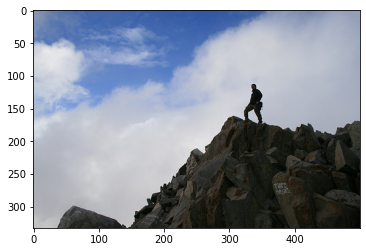

BLEU-1 score: 37.5
BLEU-2 score: 23.145502494313785
BLEU-3 score: 2.1032131949153637e-91
BLEU-4 score: 7.176381577237209e-153
Real Caption: man stands on top of rocky mountain
Predicted Caption: man at the top of rocks clouds behind


In [29]:
rid = np.random.randint(0, len(prepareDataset.img_name_val))
extract_caption(rid)

In [ ]:
len(prepareDataset.img_name_val)

8091

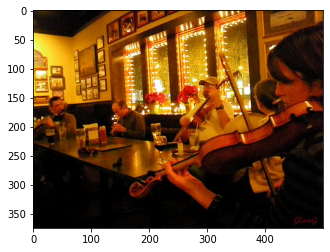

BLEU-1 score: 42.94155960430205
BLEU-2 score: 8.473621356741027e-153
BLEU-3 score: 1.6270882414495503e-183
BLEU-4 score: 1.1903225844148726e-229
Real Caption: five people sitting around table and playing various instruments
Predicted Caption: musicians sitting at table inside playing instruments


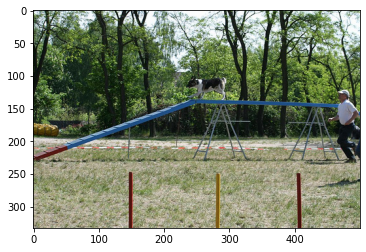

BLEU-1 score: 18.612544500887303
BLEU-2 score: 5.194120096460954e-153
BLEU-3 score: 1.145671313752559e-183
BLEU-4 score: 8.676910262183262e-230
Real Caption: dog stands on top of long blue plank of wood
Predicted Caption: dog on an obstacle platform and man


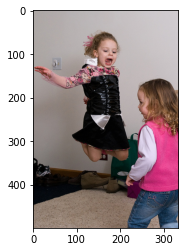

BLEU-1 score: 5.88235294117647
BLEU-2 score: 3.6178266619513135e-153
BLEU-3 score: 1.0946416849080909e-183
BLEU-4 score: 8.972141065609098e-230
Real Caption: the two little girls jump on the bed
Predicted Caption: girl in dress is jumping in the air with legs bent while another girl in pink watches


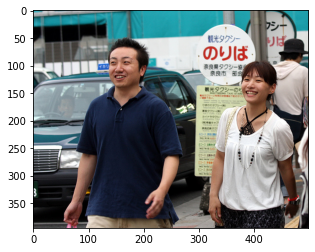

BLEU-1 score: 20.84310098392542
BLEU-2 score: 11.141106108539962
BLEU-3 score: 9.557784782265858e-92
BLEU-4 score: 3.2146414119922147e-153
Real Caption: man in blue shirt and woman in white shirt smile while walking next to cars
Predicted Caption: man with no shirt and backpack is walking


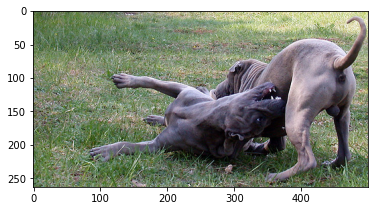

BLEU-1 score: 6.062469223956427
BLEU-2 score: 2.392603769591812e-153
BLEU-3 score: 6.062124254323657e-184
BLEU-4 score: 4.753148692240233e-230
Real Caption: brown dog is in grassy field twisting itself around to see underneath itself
Predicted Caption: two dogs are playing in the grass


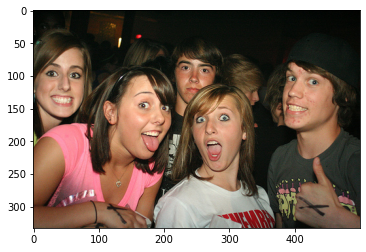

BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0
Real Caption: teens are posing for picture at crowded event
Predicted Caption: girl wearing white shirt and jean wooden sign poses with group of people behind her


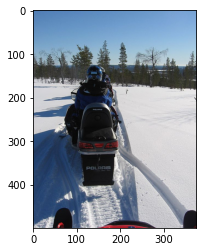

BLEU-1 score: 30.769230769230766
BLEU-2 score: 16.012815380508712
BLEU-3 score: 1.6861024029072228e-91
BLEU-4 score: 5.969061643530969e-153
Real Caption: person on polaris ski mobile in the snow
Predicted Caption: pair of people in heavy winter jackets rides through the snow on snowmobile


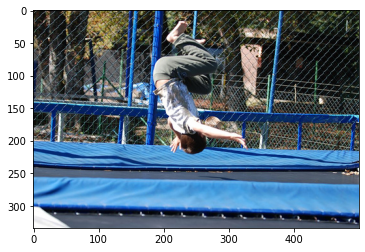

BLEU-1 score: 15.163266492815836
BLEU-2 score: 4.5237123240565193e-153
BLEU-3 score: 1.0248054361722373e-183
BLEU-4 score: 7.813508425061864e-230
Real Caption: girl is doing trick on blue trampoline and is in the air
Predicted Caption: man is jumping over another an above trampoline


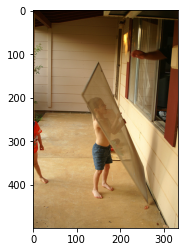

BLEU-1 score: 28.2160574963538
BLEU-2 score: 7.290027635886345e-153
BLEU-3 score: 1.5591498913318324e-183
BLEU-4 score: 1.171778691554733e-229
Real Caption: boy tries to put screen on window
Predicted Caption: young boy holding walk out window


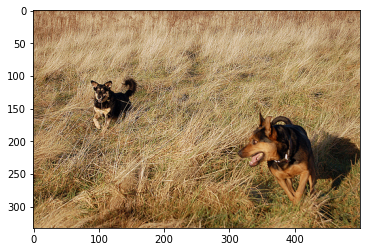

BLEU-1 score: 40.0
BLEU-2 score: 21.08185106778919
BLEU-3 score: 1.9886052149911738e-91
BLEU-4 score: 6.848990852664275e-153
Real Caption: two dogs run around together in the field
Predicted Caption: two brown and black dogs run through the dry grass


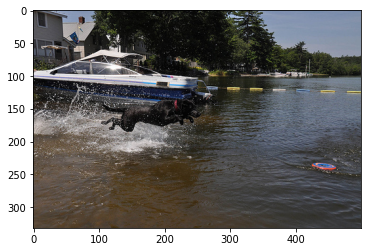

BLEU-1 score: 51.920052204760324
BLEU-2 score: 27.114362954706415
BLEU-3 score: 2.0926351909186313e-91
BLEU-4 score: 6.854647215434523e-153
Real Caption: the black dog is wearing red collar and is jumping into the water after frisbee
Predicted Caption: black dog jumping into some water to catch red and blue frisbee


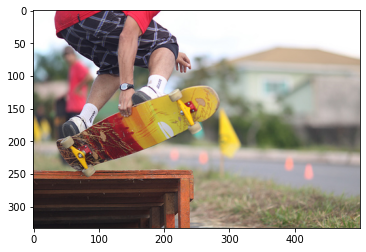

BLEU-1 score: 11.111111111111109
BLEU-2 score: 4.972227154133551e-153
BLEU-3 score: 1.3247499323693867e-183
BLEU-4 score: 1.0518351895246306e-229
Real Caption: skateboarder ollies off ramp
Predicted Caption: the skateboarder in the orange shirt balances his skateboard


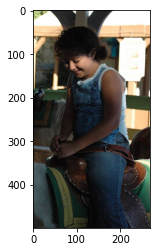

BLEU-1 score: 44.44444444444444
BLEU-2 score: 33.333333333333336
BLEU-3 score: 28.853455719062136
BLEU-4 score: 4.335118471269586e-76
Real Caption: the girl is sitting on top of saddle
Predicted Caption: person wearing jeans sits on top of horse saddle


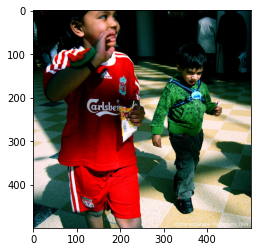

BLEU-1 score: 50.0
BLEU-2 score: 40.8248290463863
BLEU-3 score: 36.800404351813185
BLEU-4 score: 22.894156860669913
Real Caption: little boy in red walks and eats snack while little boy in green walks behind
Predicted Caption: little boy in red shirt is walking with little boy in blue shirt and black pants


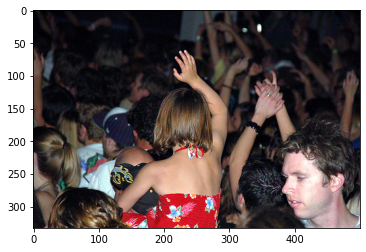

BLEU-1 score: 37.5
BLEU-2 score: 15.811388300841896
BLEU-3 score: 1.6733443899153635e-91
BLEU-4 score: 5.931400068694656e-153
Real Caption: girl in red dress is surrounded by lot of other people holding their hands up
Predicted Caption: crowd of people is facing the same direction while some hold their hands in the air


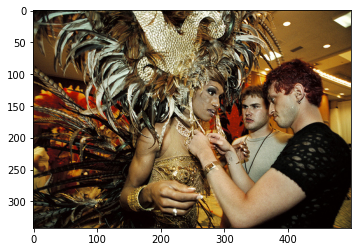

BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0
Real Caption: man is placing jewelry on an and decorated female sculpture or woman
Predicted Caption: large dancer at party


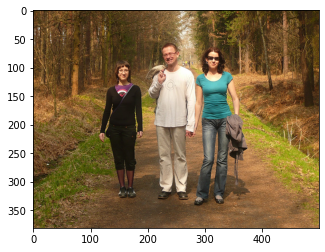

BLEU-1 score: 12.383969996431167
BLEU-2 score: 4.887436488566011e-153
BLEU-3 score: 1.2383265317623888e-183
BLEU-4 score: 9.709385502639236e-230
Real Caption: two women and man posing on rural path
Predicted Caption: three friends on stroll in the forest


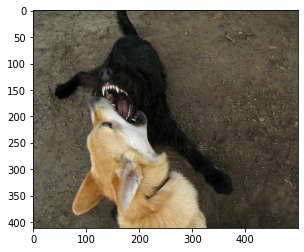

BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0
Real Caption: two dogs are bearing their teeth at each other
Predicted Caption: brown dog watching white dog with black collar and tan dog


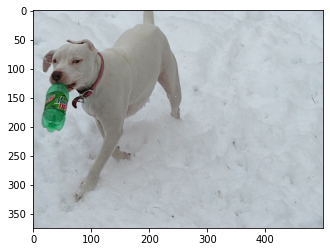

BLEU-1 score: 66.6736398613546
BLEU-2 score: 52.383758747059495
BLEU-3 score: 39.699465474501025
BLEU-4 score: 27.080996975598865
Real Caption: white dog in the snow carries plastic mountain dew bottle in its mouth
Predicted Caption: white dog carries bottle in its mouth across the snow


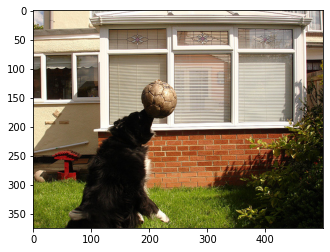

BLEU-1 score: 23.529411764705884
BLEU-2 score: 17.149858514250884
BLEU-3 score: 1.756951019348127e-91
BLEU-4 score: 6.177353952717761e-153
Real Caption: black dog jumping to get soccer ball
Predicted Caption: black dog holds beat up soccer ball in his mouth on the grass in front of home


In [30]:
rnd_images=random.choices(range(0,len(prepareDataset.img_name_val)),k=20)
for rid in rnd_images:
  extract_caption(rid)

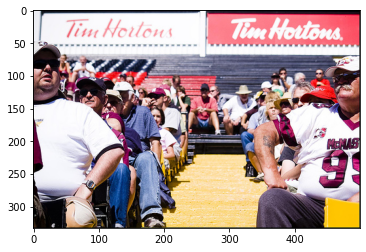

BLEU-1 score: 3.7037037037037033
BLEU-2 score: 2.643505285727146
BLEU-3 score: 5.721520249102457e-92
BLEU-4 score: 2.425282355953011e-153
Real Caption: crowd of people are sitting in seats in sports ground bleachers
Predicted Caption: group of people sit watching an event behind <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>


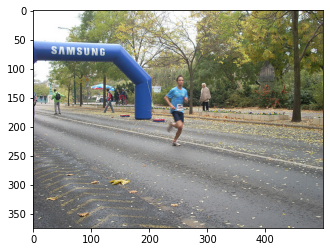

BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0
Real Caption: man in blue shirt runs under blue road marker in race
Predicted Caption: runner jogging on city street past samsung advertisement banner


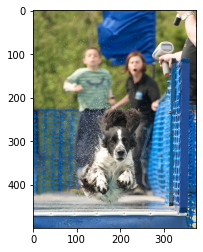

BLEU-1 score: 20.10960138106918
BLEU-2 score: 5.476650797505702e-153
BLEU-3 score: 1.1962590669600284e-183
BLEU-4 score: 9.03796893961078e-230
Real Caption: small white and black dog is running through blue netted course while people watch
Predicted Caption: dog speed is measured by man while the dog runs


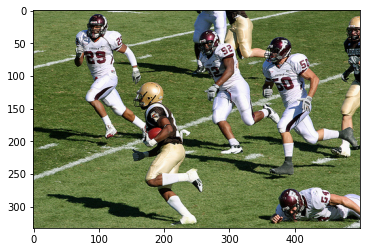

BLEU-1 score: 40.0
BLEU-2 score: 31.6227766016838
BLEU-3 score: 2.536315813271983e-91
BLEU-4 score: 8.38826642100846e-153
Real Caption: men playing football
Predicted Caption: two football players playing football


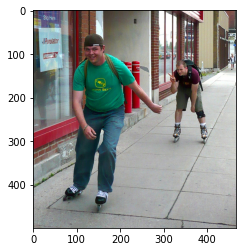

BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229
Real Caption: two boys rollerblading
Predicted Caption: two men are rollerskating on sidewalk


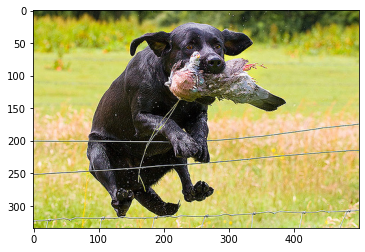

BLEU-1 score: 9.048374180359598
BLEU-2 score: 4.2681804036729734e-153
BLEU-3 score: 1.1613876691169721e-183
BLEU-4 score: 9.269981669466711e-230
Real Caption: dog trying to jump wire fence with something in his mouth
Predicted Caption: the black dog is jumping up on its back legs


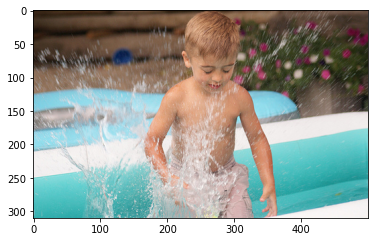

BLEU-1 score: 9.697196786440506
BLEU-2 score: 6.856953606192478
BLEU-3 score: 3.986029785373317e-92
BLEU-4 score: 1.2163566271735512e-153
Real Caption: boy in an inflatable pool is being splashed with water
Predicted Caption: boy in water


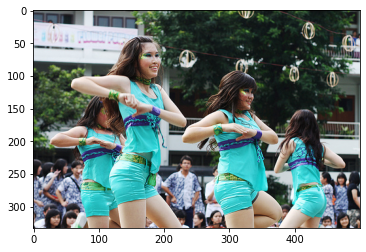

BLEU-1 score: 12.04776847648808
BLEU-2 score: 2.8415076727790637e-153
BLEU-3 score: 5.859644627459847e-184
BLEU-4 score: 4.3638512969692e-230
Real Caption: group of young women doing in matching teal outfits doing dance
Predicted Caption: four women dance for crowd


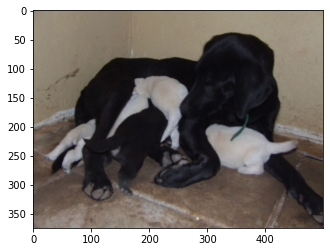

BLEU-1 score: 22.22222222222222
BLEU-2 score: 16.666666666666668
BLEU-3 score: 1.7270804940051994e-91
BLEU-4 score: 6.08970970641905e-153
Real Caption: black dog nursing black and white puppies
Predicted Caption: black dog is biting the neck of brown dog


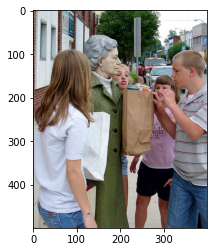

BLEU-1 score: 33.33333333333333
BLEU-2 score: 8.612150057732662e-153
BLEU-3 score: 1.8419179593432007e-183
BLEU-4 score: 1.384292958842266e-229
Real Caption: children look at statue of woman carrying grocery bag
Predicted Caption: kids looking in an old woman grocery paper bag


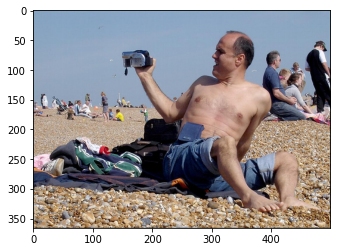

BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230
Real Caption: shirtless guy turned around videotaping something at the beach
Predicted Caption: the man is wearing rolled up blue jeans and holding video camera


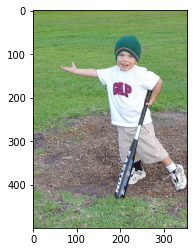

BLEU-1 score: 50.0
BLEU-2 score: 40.8248290463863
BLEU-3 score: 31.306003451477082
BLEU-4 score: 4.640083527732319e-76
Real Caption: young boy with baseball bat <unk> his arm out
Predicted Caption: young boy wearing white and orange hat with baseball bat


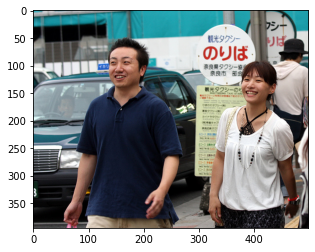

BLEU-1 score: 17.182231969774307
BLEU-2 score: 5.126037622123983e-153
BLEU-3 score: 1.1612566946930451e-183
BLEU-4 score: 8.853864984883468e-230
Real Caption: an oriental man and woman walk smiling past signs and automobiles
Predicted Caption: man with no shirt and backpack is walking


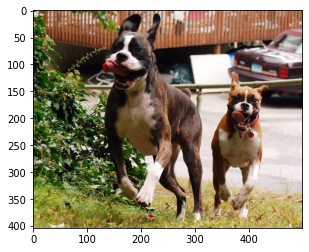

BLEU-1 score: 11.847987712695618
BLEU-2 score: 2.6996359539172135e-153
BLEU-3 score: 5.490792144363403e-184
BLEU-4 score: 4.0750740756837155e-230
Real Caption: two brown and white dogs are next to each other with red toys in their mouths
Predicted Caption: two dogs running and jumping up hill


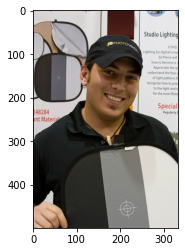

BLEU-1 score: 7.667036788577694
BLEU-2 score: 3.961780279283488e-153
BLEU-3 score: 1.1180496196598813e-183
BLEU-4 score: 9.005789782247614e-230
Real Caption: man smiles and poses with product he appears to be trying to sell
Predicted Caption: man in black shirt is smiling while being watched by large crowd


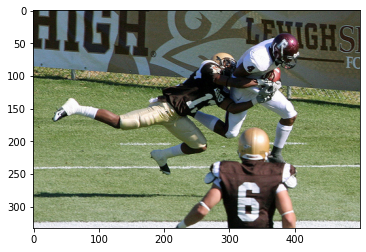

BLEU-1 score: 10.270758704647536
BLEU-2 score: 2.340254745821832e-153
BLEU-3 score: 4.759846362070543e-184
BLEU-4 score: 3.532591656055112e-230
Real Caption: the american footballer in brown is tackling the player in whit who is running with the ball
Predicted Caption: the is tackled after making the catch


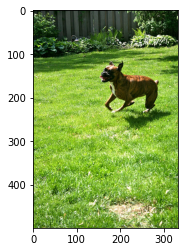

BLEU-1 score: 17.573142541048448
BLEU-2 score: 3.210460101135254e-153
BLEU-3 score: 5.977505328453229e-184
BLEU-4 score: 4.339365177986787e-230
Real Caption: dog running in the fenced in backyard
Predicted Caption: dog in grass


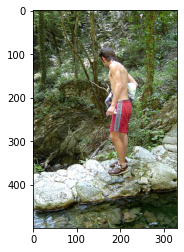

BLEU-1 score: 38.46153846153847
BLEU-2 score: 17.90287185098582
BLEU-3 score: 1.8028390283166976e-91
BLEU-4 score: 6.311514251575016e-153
Real Caption: man is walking on rocks with water flowing around them
Predicted Caption: man in red shorts is walking along rocks by the water carrying stick


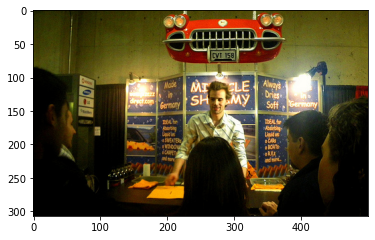

BLEU-1 score: 12.124938447912854
BLEU-2 score: 3.3836527003416395e-153
BLEU-3 score: 7.463350408713334e-184
BLEU-4 score: 5.652478243478208e-230
Real Caption: blonde haired man is doing demonstration in front of small crowd of people
Predicted Caption: man shows off his to many people


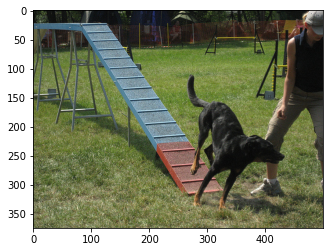

BLEU-1 score: 2.05212496559747
BLEU-2 score: 6.122178886571446e-154
BLEU-3 score: 1.3869233396679016e-184
BLEU-4 score: 1.057443375777407e-230
Real Caption: black dog has just run down blue and red ramp on an obstacle course
Predicted Caption: dog jumps over hurdle


In [31]:
rnd_images=random.choices(range(0,len(prepareDataset.img_name_val)),k=20)
for rid in rnd_images:
  extract_caption(rid)

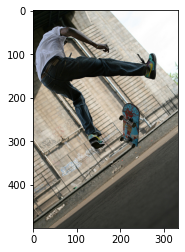

BLEU-1 score: 6.375038008193696
BLEU-2 score: 2.8528323383676753e-153
BLEU-3 score: 7.600798053186184e-184
BLEU-4 score: 6.034940380417626e-230
Real Caption: young man is caught in midair while doing skateboard trick in an urban environment
Predicted Caption: person jumps high above their skateboard on the street


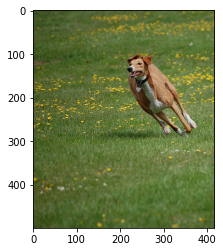

BLEU-1 score: 13.406400920712787
BLEU-2 score: 4.471666651098519e-153
BLEU-3 score: 1.0592485173532028e-183
BLEU-4 score: 8.166726842395623e-230
Real Caption: the brown dog runs through the field
Predicted Caption: dog in grass carrying frisbee


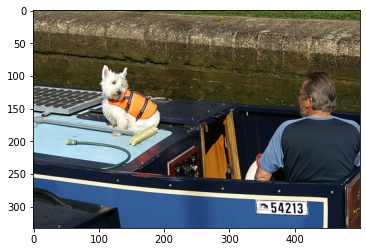

BLEU-1 score: 32.962031510022186
BLEU-2 score: 19.876852881202804
BLEU-3 score: 1.6249106672341907e-91
BLEU-4 score: 5.399679840837372e-153
Real Caption: <unk> dog in an orange life vest looking at man in blue shirt while riding in boat
Predicted Caption: dog in life jacket sitting on boat with man in the cockpit


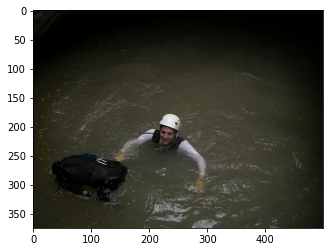

BLEU-1 score: 14.285714285714285
BLEU-2 score: 5.637975647982814e-153
BLEU-3 score: 1.4284901392909564e-183
BLEU-4 score: 1.1200407237786664e-229
Real Caption: man in helmet treads water
Predicted Caption: the person in the white helmet is in their boat while holding at river


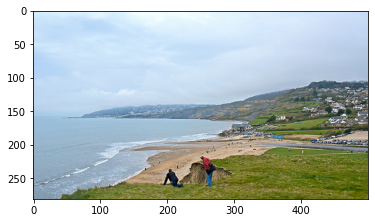

BLEU-1 score: 18.181818181818183
BLEU-2 score: 6.360494346864464e-153
BLEU-3 score: 1.5356698295026469e-183
BLEU-4 score: 1.1896457329133972e-229
Real Caption: two men stand on cliff top overlooking sandy beach
Predicted Caption: the woman is playing with the ocean dog on the beach


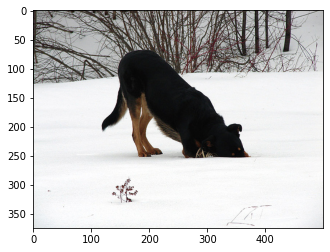

BLEU-1 score: 61.91984998215584
BLEU-2 score: 29.91012913863172
BLEU-3 score: 2.3167409477119415e-91
BLEU-4 score: 7.595569210207636e-153
Real Caption: black and brown dog digging through the snow
Predicted Caption: black dog is digging in the snow


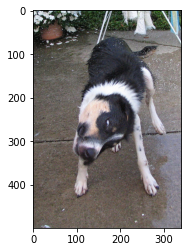

BLEU-1 score: 19.470019576785123
BLEU-2 score: 5.808561601872144e-153
BLEU-3 score: 1.3158762272049197e-183
BLEU-4 score: 1.0032743411283238e-229
Real Caption: dog is shaking off water
Predicted Caption: dog shakes his head


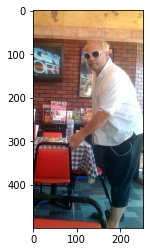

BLEU-1 score: 44.236431807201384
BLEU-2 score: 24.799470552738452
BLEU-3 score: 1.8953903642346373e-91
BLEU-4 score: 6.193423636178343e-153
Real Caption: man in sunglasses gets ready to pull chair out to sit down for his meal
Predicted Caption: man about to pull out chair and sit down at restaurant


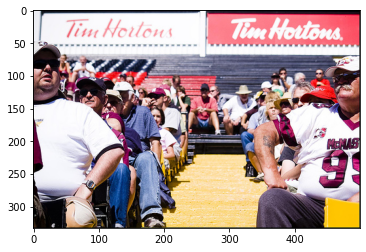

BLEU-1 score: 3.7037037037037033
BLEU-2 score: 2.643505285727146
BLEU-3 score: 5.721520249102457e-92
BLEU-4 score: 2.425282355953011e-153
Real Caption: crowd of people are sitting in seats in sports ground bleachers
Predicted Caption: group of people sit watching an event behind <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk> <unk>


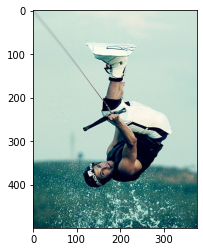

BLEU-1 score: 30.326532985631673
BLEU-2 score: 27.124875711104828
BLEU-3 score: 24.69128886558452
BLEU-4 score: 3.502929267667612e-76
Real Caption: man hangs upside in the air over the water
Predicted Caption: person on wakeboard in the air


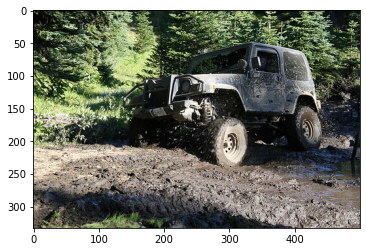

BLEU-1 score: 27.91881675133095
BLEU-2 score: 6.361471949532527e-153
BLEU-3 score: 1.2938603872273248e-183
BLEU-4 score: 9.602579706020655e-230
Real Caption: the vehicle is driving through mud surrounded by pine trees
Predicted Caption: dirty jeep is stuck in the mud


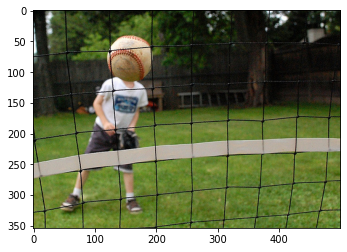

BLEU-1 score: 28.2160574963538
BLEU-2 score: 7.290027635886345e-153
BLEU-3 score: 1.5591498913318324e-183
BLEU-4 score: 1.171778691554733e-229
Real Caption: baseball is being thrown at volleyball net
Predicted Caption: the boy is going through baseball


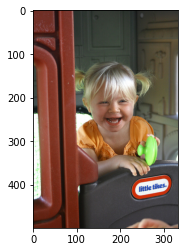

BLEU-1 score: 40.0
BLEU-2 score: 21.08185106778919
BLEU-3 score: 1.9886052149911738e-91
BLEU-4 score: 6.848990852664275e-153
Real Caption: little girl laughs while playing in play house
Predicted Caption: little girl with ponytails laughs near plastic castle play set


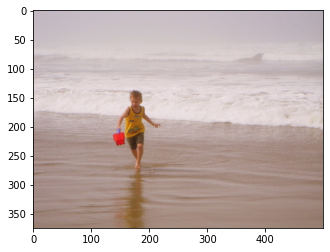

BLEU-1 score: 25.0
BLEU-2 score: 15.075567228888179
BLEU-3 score: 1.6261759223357467e-91
BLEU-4 score: 5.791739854583281e-153
Real Caption: boy in yellow tank top runs away from crashing wave
Predicted Caption: boy in red runs on beach with blue bucket in his hand


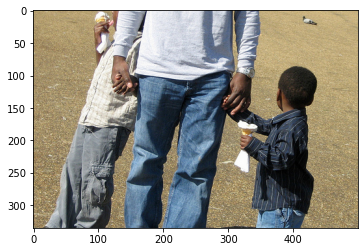

BLEU-1 score: 27.27272727272727
BLEU-2 score: 16.514456476895408
BLEU-3 score: 1.7175994813661398e-91
BLEU-4 score: 6.061838450024688e-153
Real Caption: the man is holding the hands of two boys
Predicted Caption: two boys spraying each other with the one leg to stand


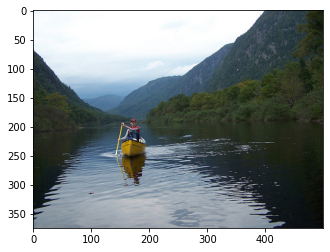

BLEU-1 score: 0
BLEU-2 score: 0
BLEU-3 score: 0
BLEU-4 score: 0
Real Caption: man with an orange hat in yellow canoe paddles along river in wooded mountainous area
Predicted Caption: hiker is sitting on the ground looking out over the mountains


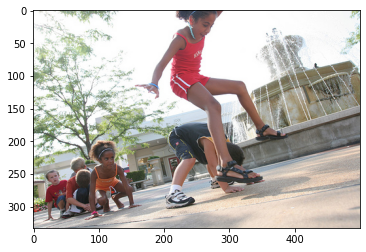

BLEU-1 score: 43.90493088752211
BLEU-2 score: 24.543602502982406
BLEU-3 score: 1.7137033234709905e-91
BLEU-4 score: 5.474607971919403e-153
Real Caption: children are playing leapfrog in front of fountain
Predicted Caption: children playing leapfrog beside fountain


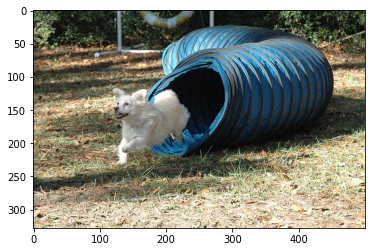

BLEU-1 score: 42.857142857142854
BLEU-2 score: 26.726124191242434
BLEU-3 score: 2.2927933779232266e-91
BLEU-4 score: 7.711523862191632e-153
Real Caption: white dog coming out of blue tunnel
Predicted Caption: white dog runs through large blue tube


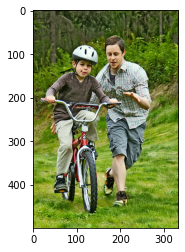

BLEU-1 score: 15.922918012750872
BLEU-2 score: 5.038498475779542e-153
BLEU-3 score: 1.168632815958936e-183
BLEU-4 score: 8.962731118674859e-230
Real Caption: boy begins to ride bike as man holds the back of it
Predicted Caption: the young man is riding bicycle through the yard


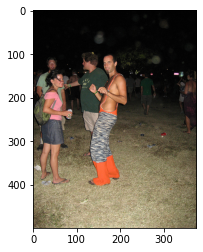

BLEU-1 score: 8.333333333333332
BLEU-2 score: 4.306075028866568e-153
BLEU-3 score: 1.2152126591739945e-183
BLEU-4 score: 9.788429383461836e-230
Real Caption: man with orange boots stands with few other people
Predicted Caption: there is woman in pink shirt holding can and three other men


In [32]:
rnd_images=random.choices(range(0,len(prepareDataset.img_name_val)),k=20)
for rid in rnd_images:
  extract_caption(rid)

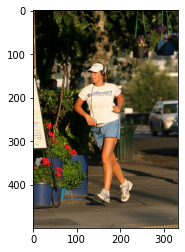

BLEU-1 score: 12.591706855837456
BLEU-2 score: 2.3003951838113042e-153
BLEU-3 score: 4.283069726958402e-184
BLEU-4 score: 3.1092910180411375e-230
Real Caption: woman wearing white hat and shirt is jogging down street with plant store on the corner
Predicted Caption: woman walks on street wearing headphones


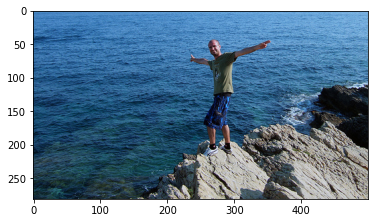

BLEU-1 score: 60.0
BLEU-2 score: 25.819888974716104
BLEU-3 score: 2.2458252053838132e-91
BLEU-4 score: 7.57965434483665e-153
Real Caption: man is standing on top of rocks overlooking the ocean
Predicted Caption: man stands on the edge of rocks near an ocean


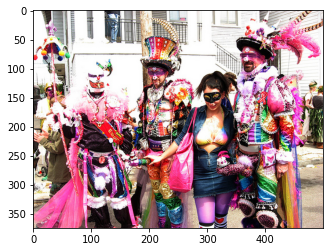

BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229
Real Caption: people in colorful costumes and masks
Predicted Caption: group of people dressed up colorfully


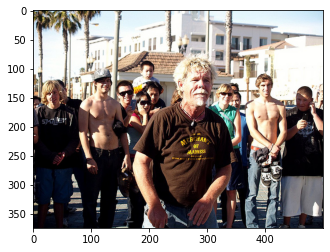

BLEU-1 score: 43.75
BLEU-2 score: 24.152294576982403
BLEU-3 score: 19.316864235990856
BLEU-4 score: 3.103010873451748e-76
Real Caption: man is posing for the camera in front of group of people
Predicted Caption: man in brown shirt and beard is being watched by group of people on the street


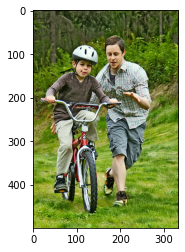

BLEU-1 score: 11.111111111111109
BLEU-2 score: 4.972227154133551e-153
BLEU-3 score: 1.3247499323693867e-183
BLEU-4 score: 1.0518351895246306e-229
Real Caption: boy riding bike while older boy runs alongside
Predicted Caption: the young man is riding bicycle through the yard


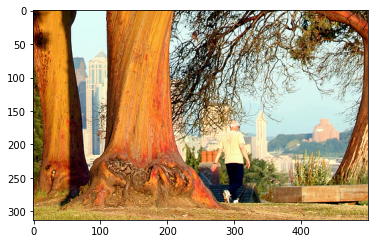

BLEU-1 score: 14.285714285714285
BLEU-2 score: 5.637975647982814e-153
BLEU-3 score: 1.4284901392909564e-183
BLEU-4 score: 1.1200407237786664e-229
Real Caption: the man walks among the large trees
Predicted Caption: man is walking past an artificial waterfall


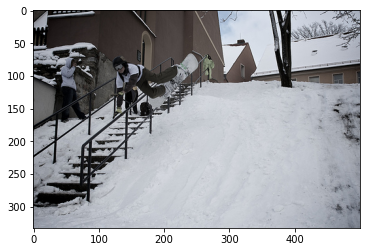

BLEU-1 score: 25.773347954661457
BLEU-2 score: 6.278088288256672e-153
BLEU-3 score: 1.3114616894303907e-183
BLEU-4 score: 9.798412298238562e-230
Real Caption: person snowboarding on hill near snow covered stairs with buildings nearby
Predicted Caption: person is walking down snowy hill on snowboard


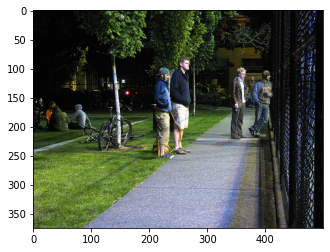

BLEU-1 score: 25.0
BLEU-2 score: 7.458340731200295e-153
BLEU-3 score: 1.6896185209462902e-183
BLEU-4 score: 1.2882297539194153e-229
Real Caption: several men are watching something through fence
Predicted Caption: several people are standing outside at road race


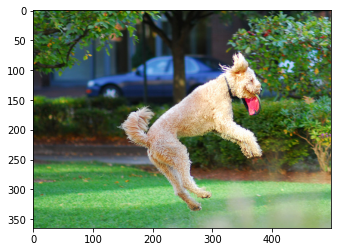

BLEU-1 score: 55.73021304462805
BLEU-2 score: 54.72598280850502
BLEU-3 score: 55.10256305207363
BLEU-4 score: 52.018706344685526
Real Caption: medium sized white dog is jumping up to catch small cloth frisbee
Predicted Caption: white dog is jumping up to catch green toy


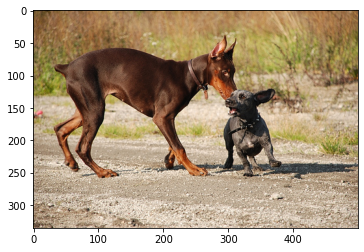

BLEU-1 score: 35.427491455576096
BLEU-2 score: 21.866322449395124
BLEU-3 score: 17.383280143141434
BLEU-4 score: 2.507989642370309e-76
Real Caption: large brown dog and small grey dog on rocky surface with weeds behind them
Predicted Caption: large brown dog sniffs small black dog behind


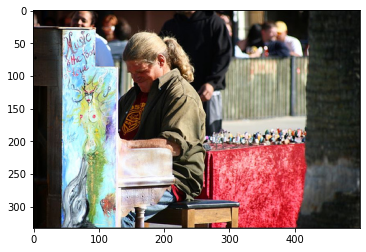

BLEU-1 score: 25.0
BLEU-2 score: 15.075567228888179
BLEU-3 score: 1.6261759223357467e-91
BLEU-4 score: 5.791739854583281e-153
Real Caption: man playing piano
Predicted Caption: man is playing piano painted with an image of woman on it


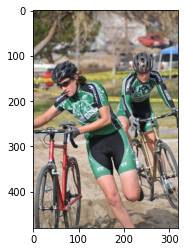

BLEU-1 score: 15.632325737944065
BLEU-2 score: 3.807853031210476e-153
BLEU-3 score: 7.954417236780597e-184
BLEU-4 score: 5.943037475387015e-230
Real Caption: two people with bicycles one in front running with bike and one in back riding
Predicted Caption: two men are riding blue and green motorcycle


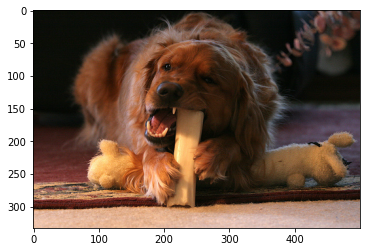

BLEU-1 score: 25.0
BLEU-2 score: 15.075567228888179
BLEU-3 score: 1.6261759223357467e-91
BLEU-4 score: 5.791739854583281e-153
Real Caption: big brown dog chews on bone lying down
Predicted Caption: brown dog is laying on the floor and is chewing on something


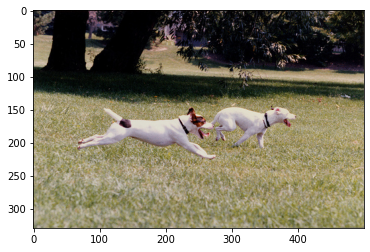

BLEU-1 score: 61.91984998215584
BLEU-2 score: 51.80586332905649
BLEU-3 score: 39.27530085176383
BLEU-4 score: 5.473461026881688e-76
Real Caption: two white dogs running in the grass together
Predicted Caption: two white dogs run through the grass


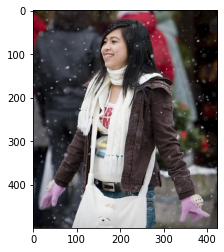

BLEU-1 score: 37.908166232039584
BLEU-2 score: 25.630598383971304
BLEU-3 score: 21.132504777560023
BLEU-4 score: 3.076833869215792e-76
Real Caption: young woman in spring coat and purple gloves stands in falling snow
Predicted Caption: woman with pink gloves stands in the snow


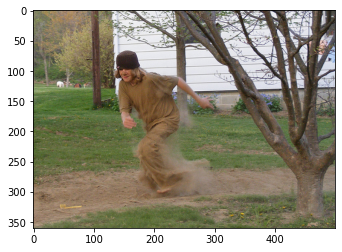

BLEU-1 score: 33.33333333333333
BLEU-2 score: 8.612150057732662e-153
BLEU-3 score: 1.8419179593432007e-183
BLEU-4 score: 1.384292958842266e-229
Real Caption: boy wearing brown running in dirt
Predicted Caption: dirty boy runs through the dirt


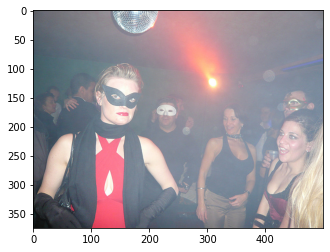

BLEU-1 score: 33.33333333333333
BLEU-2 score: 24.618298195866544
BLEU-3 score: 2.1825195678664249e-91
BLEU-4 score: 7.401184483348608e-153
Real Caption: lady in red and black grins at the camera at costume party
Predicted Caption: woman in red dress and black mask is on crowded dance floor


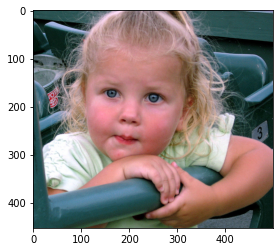

BLEU-1 score: 16.666666666666668
BLEU-2 score: 6.08970970641905e-153
BLEU-3 score: 1.4961022763680928e-183
BLEU-4 score: 1.1640469867513693e-229
Real Caption: cute toddler girl waits in her stroller
Predicted Caption: little girl is smiling while sitting in front of some stuffed animal


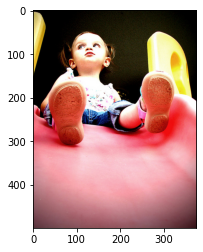

BLEU-1 score: 51.546695909322914
BLEU-2 score: 22.49682245993741
BLEU-3 score: 1.779638799911986e-91
BLEU-4 score: 5.865466933950764e-153
Real Caption: there is little girl sitting at the top of red slide
Predicted Caption: the little girl is sitting on the slide


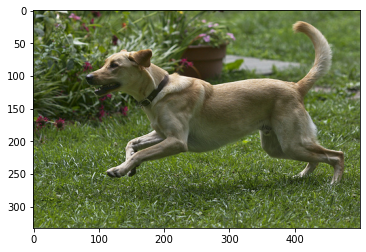

BLEU-1 score: 9.022352215774179
BLEU-2 score: 1.6483051758939466e-153
BLEU-3 score: 3.068953564736426e-184
BLEU-4 score: 2.2279043681123276e-230
Real Caption: yellow dog is playing in grassy area near flowers
Predicted Caption: dog in grass


In [33]:
rnd_images=random.choices(range(0,len(prepareDataset.img_name_val)),k=20)
for rid in rnd_images:
  extract_caption(rid)